In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import scanpy as sc
sc.set_figure_params(figsize=(8,8), fontsize=15, )

In [2]:
adata = sc.read_h5ad("../../FACS_Sampling/datasets/healty_schayan.h5ad")

/Users/ekarimi/opt/anaconda3/envs/FACS_Sampling/lib/python3.10/site-packages/anndata/compat/__init__.py:232: FutureWarning: Moving element from .uns['neighbors']['distances'] to .obsp['distances'].

This is where adjacency matrices should go now.
  warn(


In [3]:
labels = pd.read_csv("../../FACS_Sampling/datasets/labels.csv")
from operator import methodcaller
labels_ = list(map(methodcaller("split", ";"), labels[';"x"']))
labels = [labels_[i][1] for i in range(len(labels_))]
labels = [labels[i].split("\"")[1] for i in range(len(labels))]

In [4]:
adata.obs['labels'] = labels

In [5]:
adata

AnnData object with n_obs × n_vars = 30000 × 39
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'Patient', 'FlowSOM_cluster', 'FlowSOM_metacluster', 'RNA_snn_res.0.2', 'RNA_snn_res.0.4', 'RNA_snn_res.0.6', 'RNA_snn_res.0.8', 'RNA_snn_res.1', 'RNA_snn_res.1.2', 'RNA_snn_res.1.4', 'seurat_clusters', 'Cluster_anno', 'labels'
    var: 'features'
    uns: 'neighbors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances'

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.
/Users/ekarimi/opt/anaconda3/envs/FACS_Sampling/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


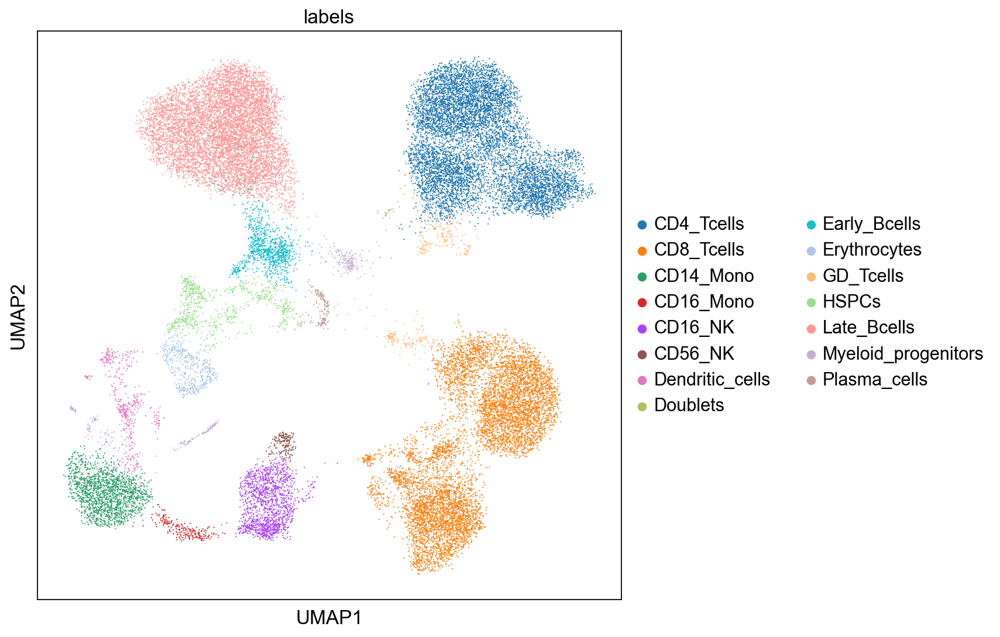

In [6]:
sc.pp.neighbors(adata)
sc.tl.umap(adata)
sc.pl.umap(adata, color='labels')

In [7]:
adata.obs["labels"].cat.categories

Index(['CD4_Tcells', 'CD8_Tcells', 'CD14_Mono', 'CD16_Mono', 'CD16_NK',
       'CD56_NK', 'Dendritic_cells', 'Doublets', 'Early_Bcells',
       'Erythrocytes', 'GD_Tcells', 'HSPCs', 'Late_Bcells',
       'Myeloid_progenitors', 'Plasma_cells'],
      dtype='object')

/Users/ekarimi/opt/anaconda3/envs/FACS_Sampling/lib/python3.10/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],
/Users/ekarimi/opt/anaconda3/envs/FACS_Sampling/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


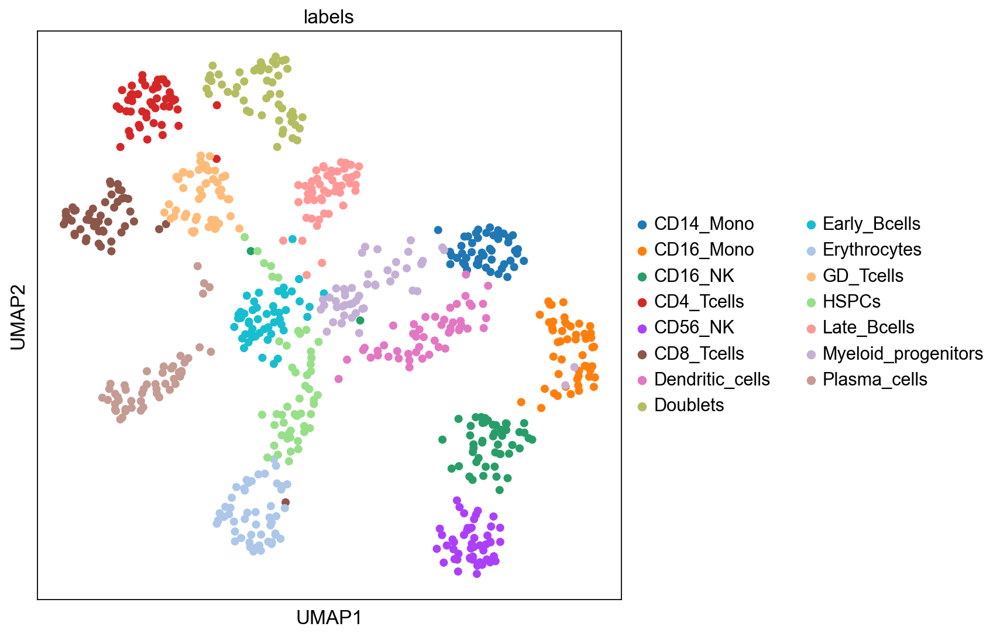

In [8]:
from FACS_Sampling.preprocessing.utils import set_reference_colors

dictionary = set_reference_colors(adata, cluster_key='labels')
cluster_key = 'labels'
label_key = 'labels'

In [9]:
from FACS_Sampling.plotting.plotting import change_cmap

ref_adata = adata
change_cmap(ref_adata, dictionary)

### Draw samples

In [10]:
from FACS_Sampling.methods.methods import bin_sample, sample_random, proportional_sampling

In [11]:
fsbs_samples, _ = bin_sample(ref_adata, n_bins=14, s_size=20)
print(fsbs_samples.size)
random_samples = sample_random(ref_adata, s_size=fsbs_samples.size)
proportional_samples, _ = proportional_sampling(ref_adata, n_bins=16,
                                      total_size=189, power= 0.01, seed= 12345)

5217


### Plots

In [12]:
sc.set_figure_params(dpi=300, color_map = 'viridis_r', figsize=(8,8), fontsize=15,)
sc.settings.verbosity = 1
sc.logging.print_header()
# sc.set_figure_params(figsize=(8,8), fontsize=15, )



scanpy==1.9.1 anndata==0.8.0 umap==0.5.3 numpy==1.23.5 scipy==1.10.0 pandas==1.5.2 scikit-learn==1.2.0 statsmodels==0.13.5 python-igraph==0.9.11 pynndescent==0.5.8


In [13]:
adata_random = ref_adata[random_samples]
change_cmap(adata_random, dictionary, celltype_key=label_key)
sc.tl.leiden(adata_random, resolution= 2)

/Users/ekarimi/PycharmProjects/FACS_Sampling/FACS_Sampling/plotting/plotting.py:9: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  sc.pp.neighbors(adata, n_neighbors = 30)


/Users/ekarimi/opt/anaconda3/envs/FACS_Sampling/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/ekarimi/opt/anaconda3/envs/FACS_Sampling/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


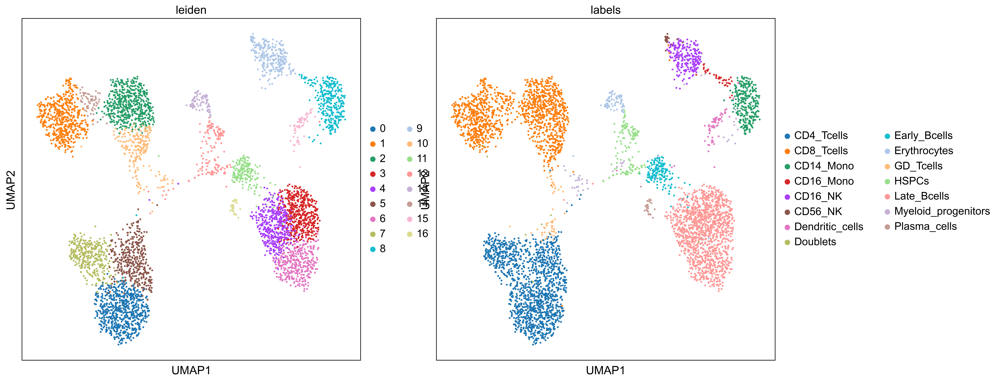

In [14]:
sc.pl.umap(adata_random, color=['leiden', label_key], save= "random_schayan")

In [15]:
adata_fsbs = ref_adata[fsbs_samples]
change_cmap(adata_fsbs, dictionary, celltype_key=label_key)
sc.tl.leiden(adata_fsbs, resolution= 2)

/Users/ekarimi/PycharmProjects/FACS_Sampling/FACS_Sampling/plotting/plotting.py:9: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  sc.pp.neighbors(adata, n_neighbors = 30)


/Users/ekarimi/opt/anaconda3/envs/FACS_Sampling/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/ekarimi/opt/anaconda3/envs/FACS_Sampling/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


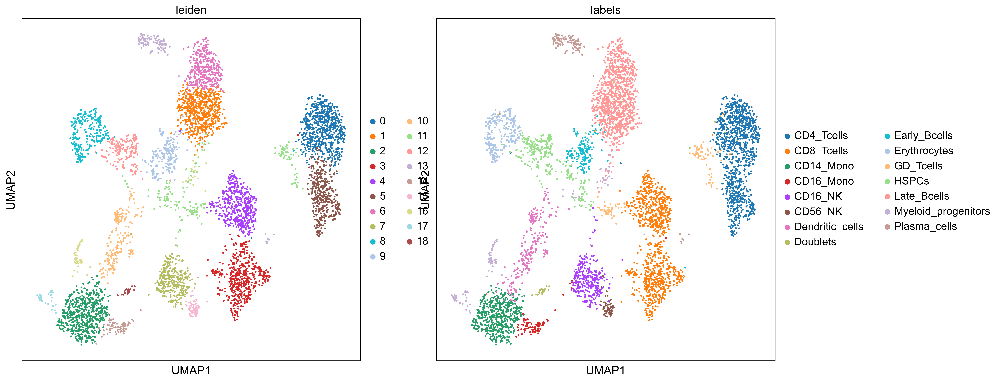

In [16]:
sc.pl.umap(adata_fsbs, color=['leiden', label_key], save='FSBS_schayan')

In [17]:
adata_prop = ref_adata[proportional_samples]
change_cmap(adata_prop, dictionary,celltype_key=label_key)
sc.tl.leiden(adata_prop, resolution= 2)

/Users/ekarimi/PycharmProjects/FACS_Sampling/FACS_Sampling/plotting/plotting.py:9: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  sc.pp.neighbors(adata, n_neighbors = 30)


/Users/ekarimi/opt/anaconda3/envs/FACS_Sampling/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/ekarimi/opt/anaconda3/envs/FACS_Sampling/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


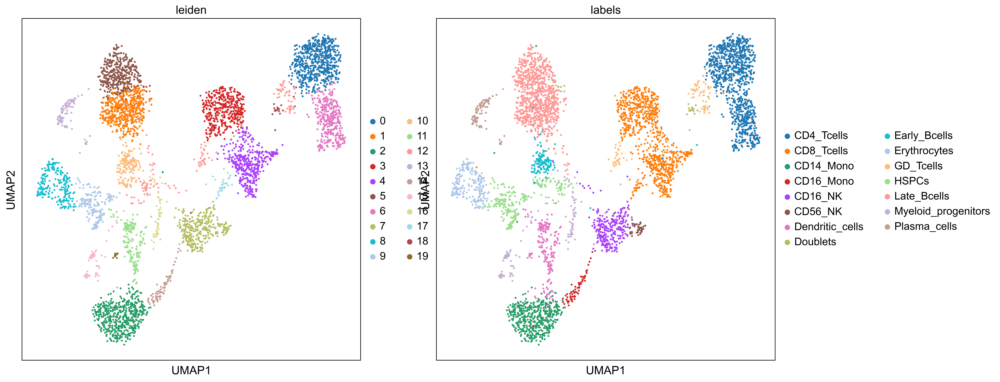

In [18]:
sc.pl.umap(adata_prop, color=['leiden', label_key], save="prop")

In [19]:
cell_type_order = ref_adata.obs[label_key].value_counts().keys().values

### Bootstraping

In [20]:
from FACS_Sampling.methods.analysis import bootstrap

In [21]:
df_bootstrap = bootstrap(ref_adata, rep=40)

In [27]:
df_random = df_bootstrap[df_bootstrap['method'].isin(['Random'])]
df_fsbs = df_bootstrap[df_bootstrap['method'].isin(['FSBS'])]
df_prop = df_bootstrap[df_bootstrap['method'].isin(['Proportional'])]

In [29]:
import seaborn as sns

sns.set(font_scale=1.5)

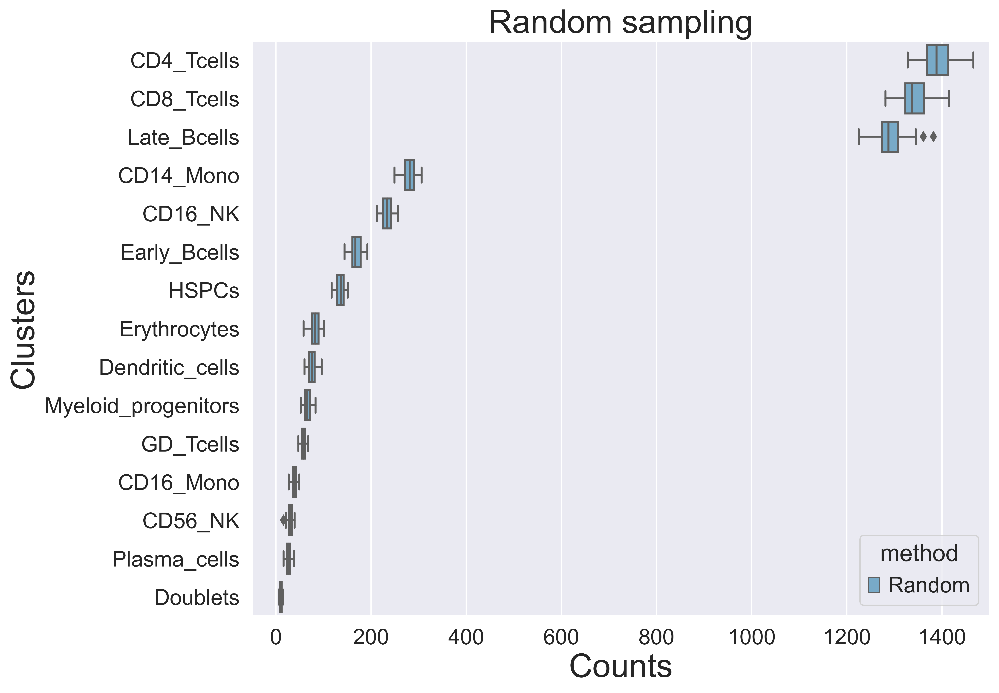

In [30]:
plt.figure(figsize=(10, 8))
g = sns.boxplot(y=label_key, x="count", hue='method',data=df_random,
                orient='h', order= cell_type_order, palette="Blues")
plt.xlim(-50, 1500)
# plt.xticks(rotation=90)
plt.ylabel("Clusters", size = 25)
plt.xlabel("Counts", size = 25)
plt.title("Random sampling", size= 25)
plt.savefig("Random.png", dpi=200, bbox_inches='tight', pad_inches = 0.5)

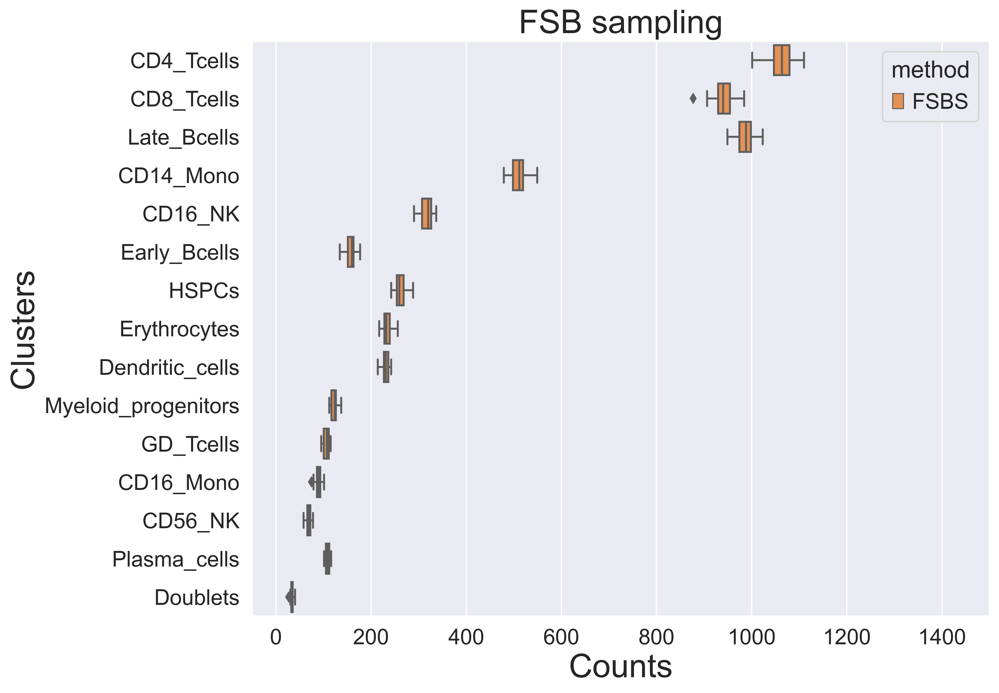

In [31]:
plt.figure(figsize=(10, 8))
g = sns.boxplot(y=label_key, x="count", hue='method',data=df_fsbs,
                orient='h', order= cell_type_order, palette='Oranges')
plt.xlim(-50, 1500)
# plt.xticks(rotation=90)
plt.ylabel("Clusters", size = 25)
plt.xlabel("Counts", size = 25)
plt.title("FSB sampling",  size= 25)
plt.savefig("Fixed_size_bin_sampling.png", dpi=200, bbox_inches='tight', pad_inches = 0.5)

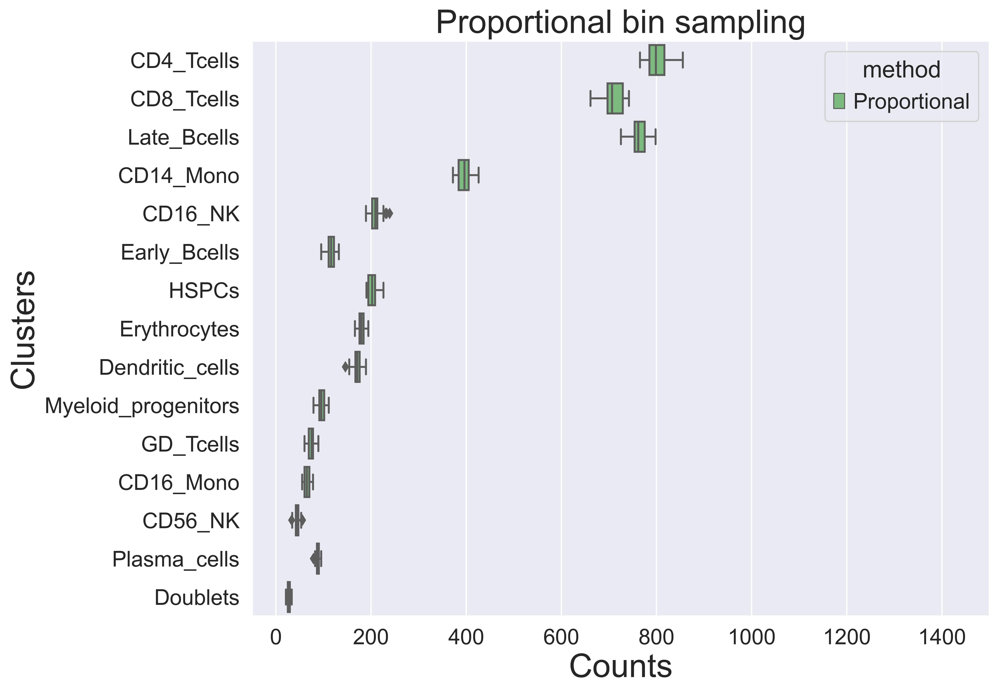

In [32]:
plt.figure(figsize=(10, 8))
g = sns.boxplot(y=label_key, x="count", hue='method',data=df_prop,
                orient='h', order= cell_type_order, palette="Greens")
plt.xlim(-50, 1500)
# plt.xticks(rotation=90)
plt.ylabel("Clusters", size = 25)
plt.xlabel("Counts", size = 25)
plt.title("Proportional bin sampling",  size= 25)
plt.savefig("Proportional_per_bin_counts.png", dpi=200, bbox_inches='tight', pad_inches = 0.5)

### Check the MNN

In [35]:
from FACS_Sampling.methods.analysis import get_knn_classification_report

In [42]:
print(get_knn_classification_report(random_samples, ref_adata, label_key)[1])

                     precision    recall  f1-score   support

          CD14_Mono       0.95      1.00      0.97      1314
          CD16_Mono       0.97      0.92      0.94       188
            CD16_NK       0.95      0.99      0.97      1093
         CD4_Tcells       0.99      1.00      0.99      6608
            CD56_NK       0.99      0.71      0.83       151
         CD8_Tcells       0.99      1.00      1.00      6377
    Dendritic_cells       0.99      0.88      0.93       381
           Doublets       1.00      0.36      0.53        53
       Early_Bcells       0.94      0.95      0.94       770
       Erythrocytes       0.98      0.98      0.98       393
          GD_Tcells       0.98      0.77      0.86       281
              HSPCs       0.94      0.95      0.95       615
        Late_Bcells       0.99      1.00      0.99      6104
Myeloid_progenitors       0.98      0.76      0.85       337
       Plasma_cells       1.00      0.92      0.96       118

           accuracy   

In [41]:
print(get_knn_classification_report(fsbs_samples, ref_adata, label_key)[1])

                     precision    recall  f1-score   support

          CD14_Mono       0.99      0.99      0.99      1086
          CD16_Mono       0.99      0.92      0.96       144
            CD16_NK       0.98      1.00      0.99      1040
         CD4_Tcells       0.99      1.00      1.00      6985
            CD56_NK       0.97      0.96      0.97       105
         CD8_Tcells       0.99      1.00      1.00      6786
    Dendritic_cells       1.00      0.98      0.99       210
           Doublets       0.90      0.28      0.43        32
       Early_Bcells       0.95      0.95      0.95       763
       Erythrocytes       0.99      0.98      0.98       228
          GD_Tcells       0.96      0.87      0.91       221
              HSPCs       0.99      0.95      0.97       489
        Late_Bcells       0.99      1.00      0.99      6392
Myeloid_progenitors       0.98      0.74      0.84       271
       Plasma_cells       1.00      0.90      0.95        31

           accuracy   